<a href="https://colab.research.google.com/github/roman-mikhaylov/ML/blob/main/ML/ML_5_5_Mikhaylov.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**1.Что представляет из себя разведочный анализ данных?**

Разведочный анализ данных - это процесс исследования и изучения набора данных с целью выявления основных закономерностей, аномалий, корреляций и других полезных характеристик. Этот вид анализа обычно проводится на начальных этапах работы с данными, когда основная цель - получить представление о структуре и свойствах данных для последующего принятия решений о том, как их обрабатывать и моделировать.

Разведочный анализ может включать в себя различные методы и инструменты, такие как визуализация данных (графики, диаграммы, тепловые карты), описательная статистика (меры центральной тенденции, меры разброса, ковариация и корреляция), а также использование алгоритмов машинного обучения для выявления скрытых закономерностей и зависимостей.

В результате разведочного анализа исследователь получает информацию о данных, которая затем может быть использована для определения целей и задач дальнейшего анализа, выбора методов моделирования и оценки результатов. Такой анализ помогает лучше понять данные, что, в свою очередь, позволяет принимать более обоснованные решения и повышать эффективность дальнейшей работы с ними.

**2.Какая основная библиотека Python используется для анализа данных этим способом?**

Сейчас самой объёмной и полной библиотекой является Pandas profiling.

Но в целом для анализа данных в Python используется множество библиотек. Некоторые из наиболее популярных включают Pandas, NumPy, SciPy, Matplotlib, Seaborn, Scikit-Learn и TensorFlow. Однако, какой именно набор библиотек будет использоваться для анализа данных, зависит от конкретной задачи и предпочтений разработчика.

**3.Опишите своими словами процесс анализа данных в соответствии с тем, что рассказывает спикер.**

 **Разведочный анализ данных**
 будем исследовать набор данных по погоде для здания id=0.


устанавливаем Pandas profiling - основная библиотека для разведки

In [1]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.8/17.8 MB 8.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 3.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 16.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 22.2 MB/s eta 0:00:00
  Created wheel for ydata-profiling: filename=ydata_profiling-0.0.dev0-py2.py3-none-any.whl size=359549 sha256=51f7d031400b818d820c15c6a7e486c51d615effea22cf6dd7de79014a8ba0f8
  Stored in directory: /tmp/pip-ephem-wheel-cache-d6amrzaa/wheels/07/29/61/f533cc7cbd0a97efb2d1b94d3254a3e859a949367ba842577b
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27080 sha256=9e7547e2e2375ca44135d40ba3ab15b3529f72c5ff97579b8a2205e5b1a9b71c
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built ydata-pro

In [2]:
# загружаем библиотеки
%matplotlib inline
import numpy as np
import pandas as pd
import pandas_profiling
import matplotlib.pyplot as plt
from matplotlib.pyplot import rcParams
rcParams['figure.figsize'] = 16,8


<ipython-input-2-b322ae0b9669>:5: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling


загружаем данные из scv, формируем data для одного здания

In [3]:
data = pd.read_csv("http://video.ittensive.com/machine-learning/ashrae/weather_train.csv.gz")

In [4]:
data = data.loc[data['site_id']==0]
data.head()

,site_id,timestamp,air_temperature,cloud_coverage,dew_temperature,precip_depth_1_hr,sea_level_pressure,wind_direction,wind_speed
0,0,2016-01-01 00:00:00,25.0,6.0,20.0,NaN,1019.7,0.0,0.0
1,0,2016-01-01 01:00:00,24.4,NaN,21.1,-1.0,1020.2,70.0,1.5
2,0,2016-01-01 02:00:00,22.8,2.0,21.1,0.0,1020.2,0.0,0.0
3,0,2016-01-01 03:00:00,21.1,2.0,20.6,0.0,1020.1,0.0,0.0
4,0,2016-01-01 04:00:00,20.0,2.0,20.0,-1.0,1020.0,250.0,2.6


замечаем, что многие данные "гряные".далее визуализируем зависимость температуры воздуха от даты/времени

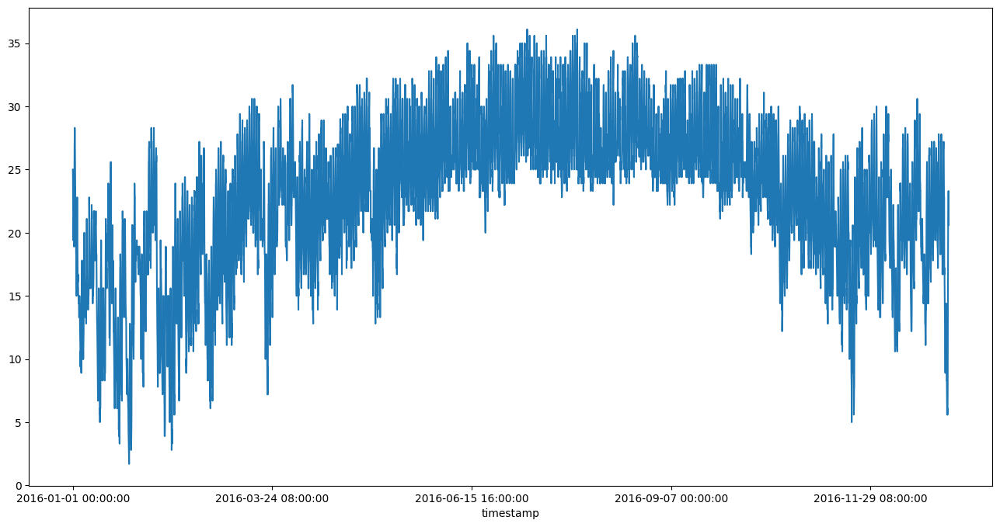

In [5]:
data.set_index("timestamp")["air_temperature"].plot()
plt.show()

замечаем, что данные ложаться в почти нормальное распределение. На температуру можем положиться для регрессионного анализа

**Исследуем данные**
используем pandas describe

In [6]:
data.describe()

,site_id,air_temperature,cloud_coverage,dew_temperature,precip_depth_1_hr,sea_level_pressure,wind_direction,wind_speed
count,8784.0,8781.000000,4954.00000,8781.000000,8783.000000,8699.000000,8534.000000,8784.000000
mean,0.0,22.836021,3.04461,16.817880,1.382557,1017.988378,156.494024,3.375114
std,0.0,6.037417,2.11878,6.519374,12.956933,4.036187,118.344523,2.154266
min,0.0,1.700000,0.00000,-9.400000,-1.000000,992.000000,0.000000,0.000000
25%,0.0,18.900000,2.00000,13.300000,0.000000,1015.500000,60.000000,2.100000
50%,0.0,23.900000,2.00000,18.300000,0.000000,1018.000000,140.000000,3.100000
75%,0.0,26.700000,4.00000,22.200000,0.000000,1020.600000,260.000000,4.600000
max,0.0,36.100000,9.00000,25.600000,343.000000,1030.200000,360.000000,15.400000


далее исследуем по каждй переменной кол-во, уникальных значений (count) , среднее значение (mean) , среднеквадратичное отклонение (std)  , перрцентили и  минимальные/максимальные. Замечаем, что выпадение осадков (precip_depth_1_hr) надо корректировать (min = -1? испарилась); с давлением все более или менее хорошо (достаточно маленькое стандартное отклонение); направление ветра выражено в градусах и стандартное отклонение почти половина максимального значания(ветер дует в разные стороны одновременно?) - необходимо преобразовать; сила ветра колеблется в небольшх пределах, как и точка росы и облачность. Пока разведочный анализ данных показывает, что опираться можем на температуру и давление, с отстальными нужно работать

In [7]:
# используем инструмент pandas profiling
pandas_profiling.ProfileReport(data, explorative = True)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

данный иснтрумент позволяет провести более профессиональный анализ каждой переменной, корреляции между ними, модели распределния и т.д.

**4. Задание спикера**

найти не менее двух "утечек" (зависимостей в данных), которые позволяют более точнее предсказать энергопотребление

Для более точного прогнозирования энергопотребления можно использовать различные факторы или зависимости в данных. Вот две потенциальные “утечки” или зависимости, которые могут улучшить точность моделей прогнозирования энергопотребления:

Зависимость от температуры: Температура является важным фактором, влияющим на энергопотребление. Например, в холодную погоду людям нужно больше энергии для отопления своих домов, а в жаркую погоду - для охлаждения. Учет колебаний температуры также может повысить точность прогнозирования энергопотребления.

Завсимость от точки росы: Точка росы — это значение температуры, при которой водяные пары, находящиеся в воздухе, конденсируют в росу. Этот показатель зависит от нескольких факторов. Ключевым является давление воздуха внутри строения и на улице и влажность в помещении. Поскольку это интегральный показатель мы смело можем указать его вторым номером.

Эти зависимости могут быть включены в модель прогнозирования энергопотребления путем добавления соответствующих переменных.

Для этого обьединим по полю "timestamp" два датфрейма data и data_toe,
и проанализируем получишийся дата фрейм  с помощью pandas profiling

In [8]:
dаta_toe = pd.read_csv("http://video.ittensive.com/machine-learning/ashrae/train.0.0.csv.gz")


In [9]:
dаta_toe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8784 entries, 0 to 8783
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   building_id    8784 non-null   int64  
 1   meter          8784 non-null   int64  
 2   timestamp      8784 non-null   object 
 3   meter_reading  8784 non-null   float64
dtypes: float64(1), int64(2), object(1)
memory usage: 274.6+ KB


In [10]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8784 entries, 0 to 8783
Data columns (total 9 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   site_id             8784 non-null   int64  
 1   timestamp           8784 non-null   object 
 2   air_temperature     8781 non-null   float64
 3   cloud_coverage      4954 non-null   float64
 4   dew_temperature     8781 non-null   float64
 5   precip_depth_1_hr   8783 non-null   float64
 6   sea_level_pressure  8699 non-null   float64
 7   wind_direction      8534 non-null   float64
 8   wind_speed          8784 non-null   float64
dtypes: float64(7), int64(1), object(1)
memory usage: 944.3+ KB


в обоих фреймах 8784 уникальных значений по полям 'timestamp'

In [11]:
data_marge = pd.merge(data,dаta_toe, on='timestamp')
data_marge.head()

,site_id,timestamp,air_temperature,cloud_coverage,dew_temperature,precip_depth_1_hr,sea_level_pressure,wind_direction,wind_speed,building_id,meter,meter_reading
0,0,2016-01-01 00:00:00,25.0,6.0,20.0,NaN,1019.7,0.0,0.0,0,0,0.0
1,0,2016-01-01 01:00:00,24.4,NaN,21.1,-1.0,1020.2,70.0,1.5,0,0,0.0
2,0,2016-01-01 02:00:00,22.8,2.0,21.1,0.0,1020.2,0.0,0.0,0,0,0.0
3,0,2016-01-01 03:00:00,21.1,2.0,20.6,0.0,1020.1,0.0,0.0,0,0,0.0
4,0,2016-01-01 04:00:00,20.0,2.0,20.0,-1.0,1020.0,250.0,2.6,0,0,0.0


In [12]:
# используем инструмент pandas profiling
pandas_profiling.ProfileReport(data_marge, explorative = True)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

по корреляции с meter_reading видим:
- 0.683 прямая зависимость с температурой наружного воздуха
- 0,711 сильная прямая зависимость от точки росы  

**5.Что представляет из себя процесс ETL?**

ETL (извлечение, преобразование, загрузка) - это процесс обработки данных, который включает в себя извлечение данных из различных источников (таких как базы данных, файлы, API и т.д.), их преобразование (при необходимости) и загрузку в целевое хранилище для дальнейшего анализа.

Этот процесс обычно используется для объединения данных из разных систем или источников в единую базу данных для последующего анализа. Он позволяет преобразовывать данные в формат, удобный для использования в аналитических инструментах, и обеспечивает их качество, полноту и согласованность перед загрузкой.

ETL-инструменты помогают автоматизировать этот процесс, что позволяет ускорить время обработки данных и повысить эффективность работы с ними.